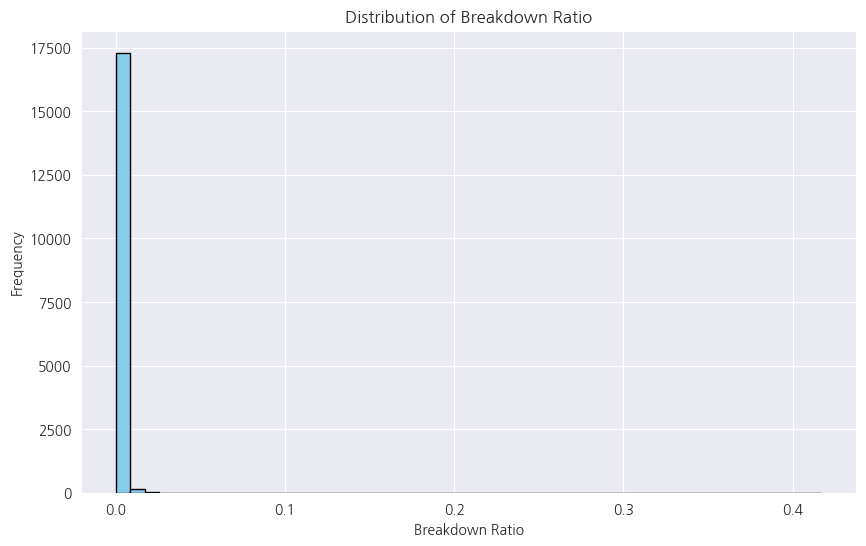

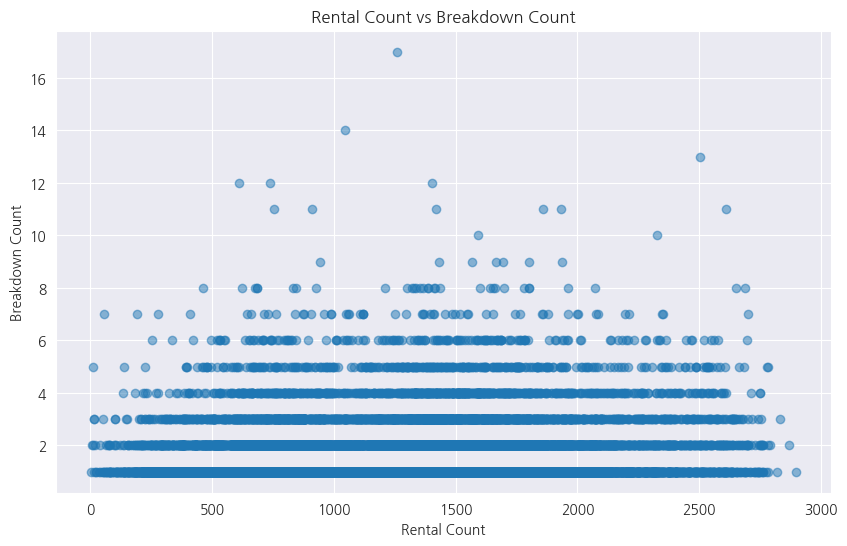

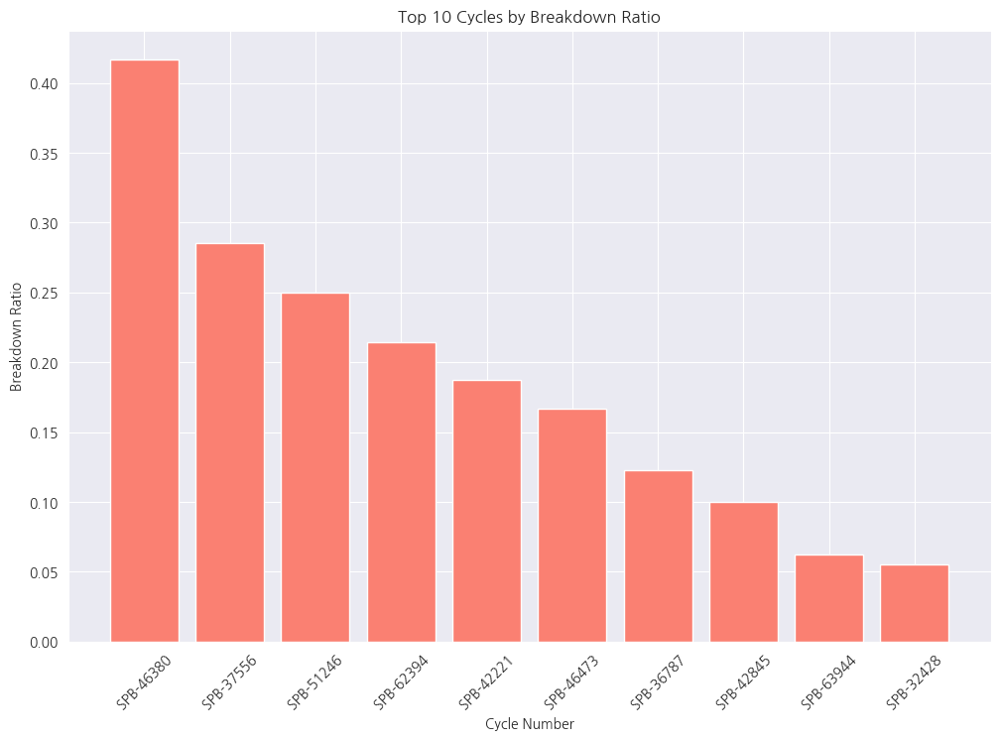

In [16]:
import matplotlib.pyplot as plt
import pandas as pd
from pymongo import MongoClient

# MongoDB 연결
client = MongoClient('mongodb://localhost:27017/')
db = client['cycle']
collection = db['cycle_breakdown_rental_correlation']

# 데이터 불러오기
data = list(collection.find({}))
df = pd.DataFrame(data)

# 히스토그램: 고장 비율 분포
plt.figure(figsize=(10, 6))
plt.hist(df['correlation'], bins=50, color='skyblue', edgecolor='black')
plt.title('Distribution of Breakdown Ratio')
plt.xlabel('Breakdown Ratio')
plt.ylabel('Frequency')
plt.show()

# 산점도: 대여 횟수와 고장 횟수 간의 관계
plt.figure(figsize=(10, 6))
plt.scatter(df['rental_count'], df['broken_count'], alpha=0.5)
plt.title('Rental Count vs Breakdown Count')
plt.xlabel('Rental Count')
plt.ylabel('Breakdown Count')
plt.show()

# 막대 차트: 상위 10개 자전거의 고장 비율
top10 = df.sort_values(by='correlation', ascending=False).head(10)
plt.figure(figsize=(12, 8))
plt.bar(top10['cycle_num'], top10['correlation'], color='salmon')
plt.title('Top 10 Cycles by Breakdown Ratio')
plt.xlabel('Cycle Number')
plt.ylabel('Breakdown Ratio')
plt.xticks(rotation=45)
plt.show()

In [17]:
import plotly.express as px
import pandas as pd
from pymongo import MongoClient

# MongoDB 연결
client = MongoClient('mongodb://localhost:27017/')
db = client['cycle']
collection = db['cycle_breakdown_rental_correlation']

# 데이터 불러오기
data = list(collection.find({}))
df = pd.DataFrame(data)

# 히스토그램: 고장 비율 분포
fig = px.histogram(df, x='correlation', nbins=50, title='Distribution of Breakdown Ratio')
fig.update_layout(bargap=0.1)
fig.show()

In [18]:
fig = px.scatter(df, x='rental_count', y='broken_count', title='Rental Count vs Breakdown Count')
fig.show()

In [19]:
top10 = df.sort_values(by='correlation', ascending=False).head(10)
fig = px.bar(top10, x='cycle_num', y='correlation', title='Top 10 Cycles by Breakdown Ratio')
fig.show()

In [20]:
import plotly.express as px

# 히트맵: 대여 횟수와 고장 횟수 간의 관계
heatmap_data = df.pivot_table(values='correlation', index='broken_count', columns='rental_count', aggfunc='mean').fillna(0)
fig = px.imshow(heatmap_data, aspect='auto', color_continuous_scale='Viridis', title='Heatmap of Rental Count vs Breakdown Count')
fig.show()

In [21]:
import plotly.express as px

# 박스 플롯: 고장 비율 분포
fig = px.box(df, y='correlation', title='Box Plot of Breakdown Ratio')
fig.show()

In [22]:
# 고장 유형별 빈도 데이터 준비
broken_types = db.broken_history.aggregate([
    {
        "$group": {
            "_id": "$content",
            "count": {"$sum": 1}
        }
    },
    {"$sort": {"count": -1}}
])

broken_types_df = pd.DataFrame(broken_types)
$$
# 파이 차트: 고장 유형 분포
fig = px.pie(broken_types_df, names='_id', values='count', title='Distribution of Breakdown Types')
fig.show()

In [15]:
# 버블 차트: 대여 횟수, 고장 횟수, 고장 비율
fig = px.scatter(df, x='rental_count', y='broken_count', size='correlation', color='correlation',
                 hover_name='cycle_num', title='Bubble Chart of Rental Count, Breakdown Count, and Breakdown Ratio')
fig.show()

In [16]:
# 트리맵: 대여 횟수와 고장 횟수
fig = px.treemap(df, path=['cycle_num'], values='rental_count', color='broken_count',
                 title='Treemap of Rental Count and Breakdown Count')
fig.show()

In [17]:
import plotly.figure_factory as ff

# 밀도 플롯: 고장 비율 분포
fig = ff.create_distplot([df['correlation']], group_labels=['Breakdown Ratio'], bin_size=0.01)
fig.update_layout(title='Density Plot of Breakdown Ratio')
fig.show()

In [18]:
import plotly.express as px

# 벌집 플롯: 대여 횟수와 고장 횟수 간의 관계
fig = px.density_heatmap(df, x='rental_count', y='broken_count', nbinsx=50, nbinsy=50, color_continuous_scale='Viridis', title='Hexbin Plot of Rental Count vs Breakdown Count')
fig.show()

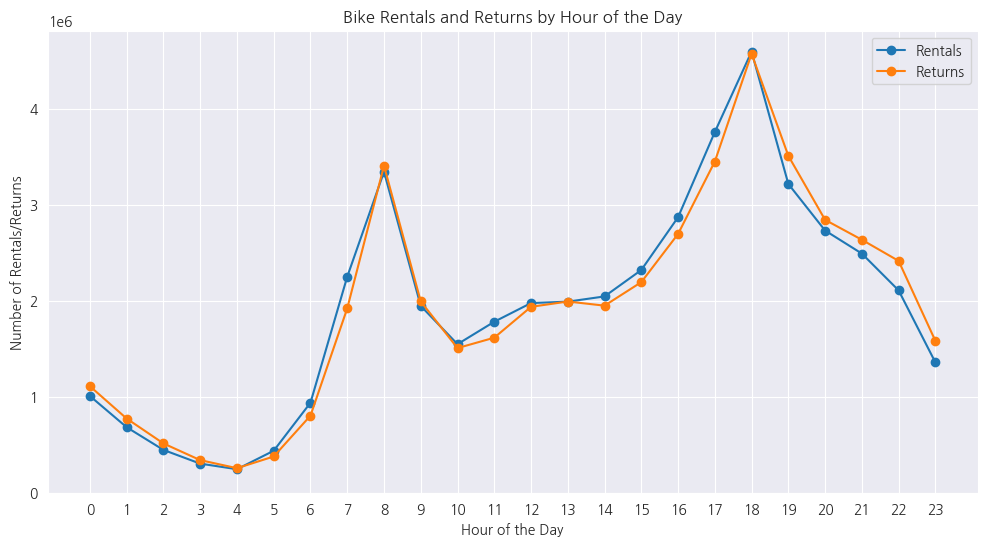

In [13]:
from pymongo import MongoClient
import matplotlib.pyplot as plt

client = MongoClient('mongodb://localhost:27017/')
db = client['cycle']

# 대여 및 반납 시간대 분석 쿼리
pipeline = [
    {
        "$project": {
            "rental_hour": {"$hour": "$rental_date"},
            "return_hour": {"$hour": "$return_date"}
        }
    },
    {
        "$facet": {
            "rental_hours": [
                {
                    "$group": {
                        "_id": "$rental_hour",
                        "count": {"$sum": 1}
                    }
                },
                {
                    "$sort": {"_id": 1}
                }
            ],
            "return_hours": [
                {
                    "$group": {
                        "_id": "$return_hour",
                        "count": {"$sum": 1}
                    }
                },
                {
                    "$sort": {"_id": 1}
                }
            ]
        }
    }
]

result = list(db.rental_info.aggregate(pipeline))

rental_hours = result[0]['rental_hours']
return_hours = result[0]['return_hours']

# Extracting data for visualization
rental_hours_data = {doc['_id']: doc['count'] for doc in rental_hours}
return_hours_data = {doc['_id']: doc['count'] for doc in return_hours}

# Creating lists of hours and counts for plotting
hours = range(24)
rental_counts = [rental_hours_data.get(hour, 0) for hour in hours]
return_counts = [return_hours_data.get(hour, 0) for hour in hours]

# Plotting the data
plt.figure(figsize=(12, 6))
plt.plot(hours, rental_counts, label='Rentals', marker='o')
plt.plot(hours, return_counts, label='Returns', marker='o')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Rentals/Returns')
plt.title('Bike Rentals and Returns by Hour of the Day')
plt.xticks(hours)
plt.yticks(range(0, max(max(rental_counts), max(return_counts)) + 1, 1000000))  # Y축 레이블을 원하는 값으로 설정
plt.grid(True)
plt.legend()
plt.show()

In [21]:
!pip install folium

  Using cached folium-0.16.0-py2.py3-none-any.whl.metadata (3.6 kB)
  Using cached branca-0.7.2-py3-none-any.whl.metadata (1.5 kB)
Using cached folium-0.16.0-py2.py3-none-any.whl (100 kB)
Using cached branca-0.7.2-py3-none-any.whl (25 kB)


In [27]:
import matplotlib.font_manager as fm

# 설치된 글꼴 목록 확인
for font in fm.findSystemFonts(fontpaths=None, fontext='ttf'):
    if 'Nanum' in font or 'D2Coding' in font or 'AppleGothic' in font:
        print(font)

/Users/jiny/Library/Fonts/NanumGothic-ExtraBold.ttf
/Users/jiny/Library/Fonts/NanumGothic-Bold.ttf
/Users/jiny/Library/Fonts/NanumGothic-Regular.ttf
/System/Library/Fonts/Supplemental/AppleGothic.ttf


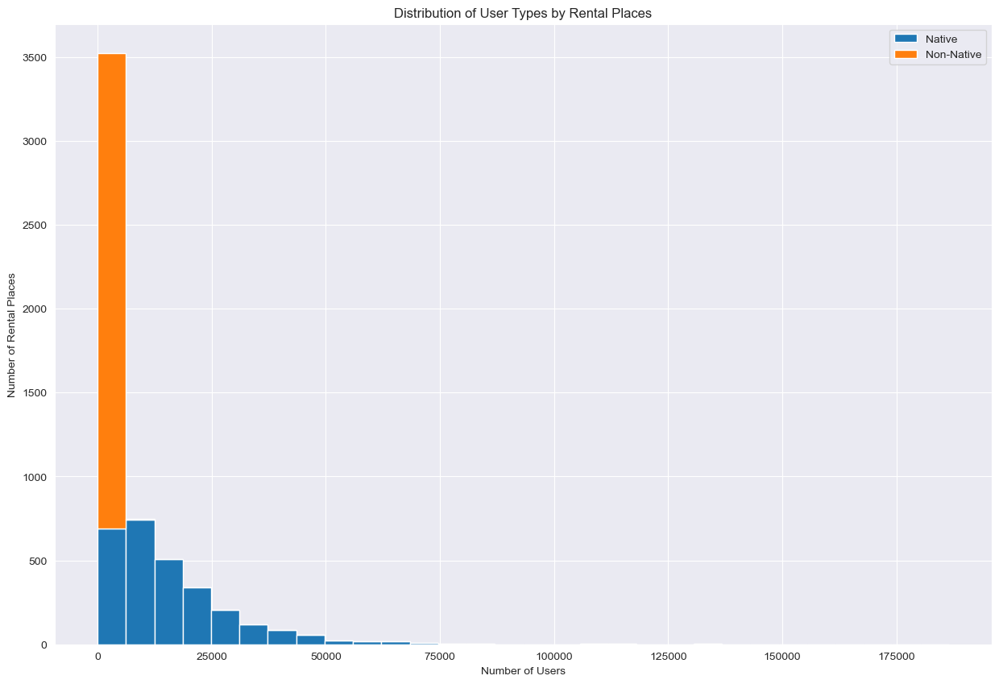

In [32]:
from pymongo import MongoClient
import matplotlib.pyplot as plt

client = MongoClient('mongodb://localhost:27017/')
db = client['cycle']

# 대여소별 이용자 유형 분석 쿼리
pipeline = [
    {
        "$group": {
            "_id": {
                "rental_place": "$rental_place",
                "usr_cls_cd": "$user.usr_cls_cd"
            },
            "totalUsers": {"$sum": 1}
        }
    },
    {
        "$project": {
            "rental_place": "$_id.rental_place",
            "usr_cls_cd": "$_id.usr_cls_cd",
            "totalUsers": 1
        }
    },
    {
        "$group": {
            "_id": "$rental_place",
            "user_types": {
                "$push": {
                    "usr_cls_cd": "$usr_cls_cd",
                    "totalUsers": "$totalUsers"
                }
            }
        }
    }
]

result = list(db.rental_info.aggregate(pipeline))

# Extracting data for visualization
places = []
native_counts = []
non_native_counts = []

for doc in result:
    places.append(doc['_id'])
    native_count = 0
    non_native_count = 0
    for user_type in doc['user_types']:
        if user_type['usr_cls_cd'] == '내국인':
            native_count = user_type['totalUsers']
        else:
            non_native_count += user_type['totalUsers']
    native_counts.append(native_count)
    non_native_counts.append(non_native_count)

# Plotting the histogram
plt.figure(figsize=(15, 10))
plt.hist([native_counts, non_native_counts], bins=30, label=['Native', 'Non-Native'], stacked=True)
plt.xlabel('Number of Users')
plt.ylabel('Number of Rental Places')
plt.title('Distribution of User Types by Rental Places')
plt.legend()
plt.show()

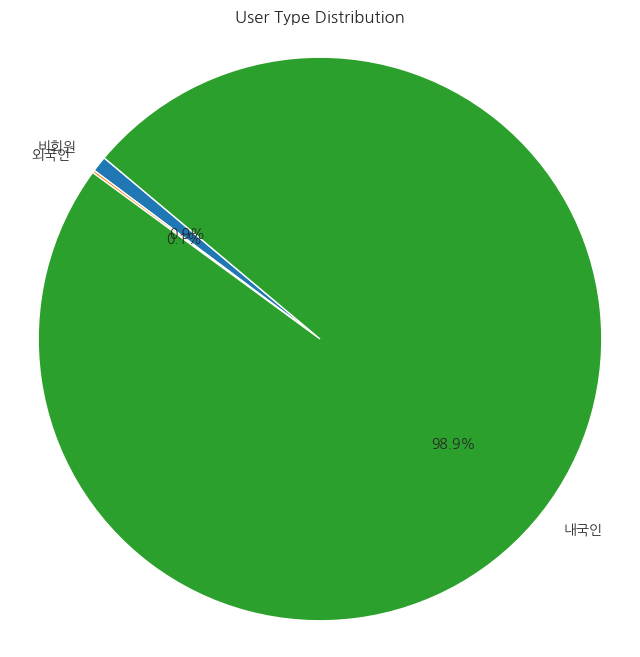

In [41]:
from pymongo import MongoClient
import matplotlib.pyplot as plt
from matplotlib import font_manager, rc

# 한글 폰트 설정
font_path = '/Users/jiny/Library/Fonts/NanumGothic-Regular.ttf'  # 사용하려는 폰트 경로로 설정
font_manager.fontManager.addfont(font_path)
font_name = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font_name)

client = MongoClient('mongodb://localhost:27017/')
db = client['cycle']

# 대여소별 이용자 유형 분석 쿼리
pipeline = [
    {
        "$group": {
            "_id": "$user.usr_cls_cd",
            "totalUsers": {"$sum": 1}
        }
    },
    {
        "$project": {
            "usr_cls_cd": "$_id",
            "totalUsers": 1
        }
    }
]

result = list(db.rental_info.aggregate(pipeline))

# Extracting data for visualization
labels = []
sizes = []

for doc in result:
    labels.append(doc['usr_cls_cd'])
    sizes.append(doc['totalUsers'])

# Plotting the pie chart
plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('User Type Distribution')
plt.show()

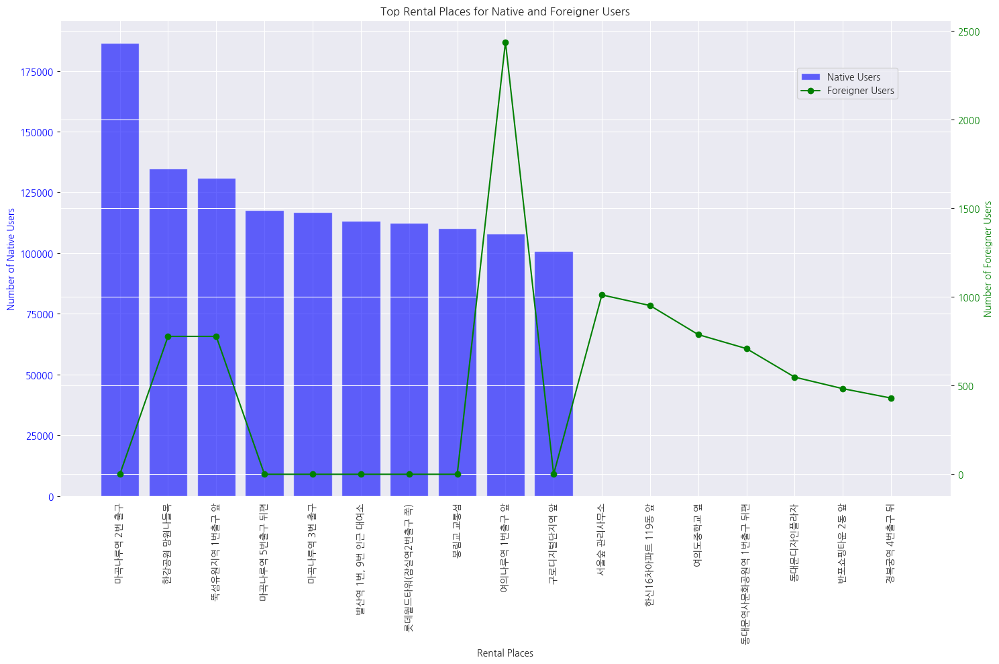

In [2]:
from pymongo import MongoClient
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import font_manager, rc

# 한글 폰트 설정
font_path = '/Users/jiny/Library/Fonts/NanumGothic-Regular.ttf'  # 사용하려는 폰트 경로로 설정
font_manager.fontManager.addfont(font_path)
font_name = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font_name)

client = MongoClient('mongodb://localhost:27017/')
db = client['cycle']

# 대여소별 내국인 및 외국인 사용자 수 상위 10개
pipeline = [
    {
        "$group": {
            "_id": {
                "rental_place": "$rental_place",
                "usr_cls_cd": "$user.usr_cls_cd"
            },
            "totalUsers": {"$sum": 1}
        }
    },
    {
        "$facet": {
            "native": [
                {"$match": {"_id.usr_cls_cd": "내국인"}},
                {"$sort": {"totalUsers": -1}},
                {"$limit": 10}
            ],
            "foreigner": [
                {"$match": {"_id.usr_cls_cd": "외국인"}},
                {"$sort": {"totalUsers": -1}},
                {"$limit": 10}
            ]
        }
    }
]

result = list(db.rental_info.aggregate(pipeline))

# 데이터가 없는 경우를 대비해 예외 처리 추가
native_places = []
native_counts = []
if 'native' in result[0]:
    native_places = [doc['_id']['rental_place'] for doc in result[0]['native']]
    native_counts = [doc['totalUsers'] for doc in result[0]['native']]

foreigner_places = []
foreigner_counts = []
if 'foreigner' in result[0]:
    foreigner_places = [doc['_id']['rental_place'] for doc in result[0]['foreigner']]
    foreigner_counts = [doc['totalUsers'] for doc in result[0]['foreigner']]

# Creating a combined DataFrame for easier plotting
df_native = pd.DataFrame({'Place': native_places, 'Native_Count': native_counts})
df_foreigner = pd.DataFrame({'Place': foreigner_places, 'Foreigner_Count': foreigner_counts})

# Merging dataframes on Place
df_combined = pd.merge(df_native, df_foreigner, on='Place', how='outer').fillna(0)

# Plotting the data
fig, ax1 = plt.subplots(figsize=(15, 10))

# Plotting native users on the primary y-axis
ax1.bar(df_combined['Place'], df_combined['Native_Count'], color='blue', label='Native Users', alpha=0.6)
ax1.set_xlabel('Rental Places')
ax1.set_ylabel('Number of Native Users', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.tick_params(axis='x', rotation=90)

# Creating a secondary y-axis for foreign users
ax2 = ax1.twinx()
ax2.plot(df_combined['Place'], df_combined['Foreigner_Count'], color='green', marker='o', linestyle='-', label='Foreigner Users')
ax2.set_ylabel('Number of Foreigner Users', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Adding title and legend
plt.title('Top Rental Places for Native and Foreigner Users')
fig.tight_layout()
fig.legend(loc='upper right', bbox_to_anchor=(0.9,0.9))

plt.show()

Execution time after indexing: 37.26272797584534 seconds


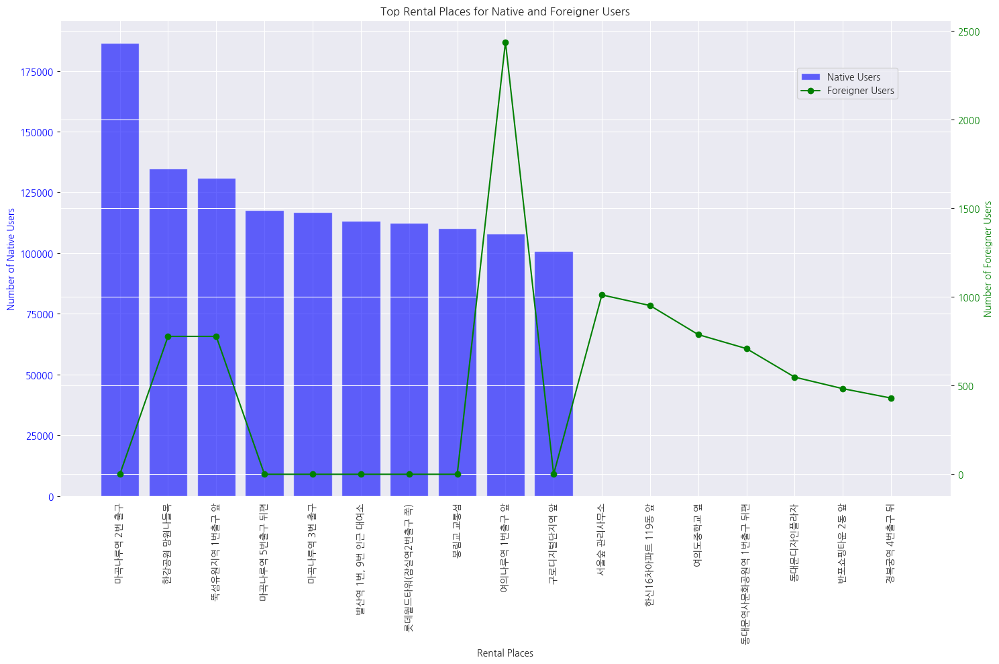

In [41]:
import time
from pymongo import MongoClient
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import font_manager, rc

# 한글 폰트 설정
font_path = '/Users/jiny/Library/Fonts/NanumGothic-Regular.ttf'  # 사용하려는 폰트 경로로 설정
font_manager.fontManager.addfont(font_path)
font_name = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font_name)

client = MongoClient('mongodb://localhost:27017/')
db = client['cycle']

# 인덱스 생성 전 실행 시간 측정
start_time = time.time()

# 대여소별 내국인 및 외국인 사용자 수 상위 10개
pipeline = [
    {
        "$group": {
            "_id": {
                "rental_place": "$rental_place",
                "usr_cls_cd": "$user.usr_cls_cd"
            },
            "totalUsers": {"$sum": 1}
        }
    },
    {
        "$facet": {
            "native": [
                {"$match": {"_id.usr_cls_cd": "내국인"}},
                {"$sort": {"totalUsers": -1}},
                {"$limit": 10}
            ],
            "foreigner": [
                {"$match": {"_id.usr_cls_cd": "외국인"}},
                {"$sort": {"totalUsers": -1}},
                {"$limit": 10}
            ]
        }
    }
]

result = list(db.rental_info.aggregate(pipeline))

end_time = time.time()
execution_time_before_index = end_time - start_time
print(f"Execution time after indexing: {execution_time_before_index} seconds")

# 데이터가 없는 경우를 대비해 예외 처리 추가
native_places = []
native_counts = []
if 'native' in result[0]:
    native_places = [doc['_id']['rental_place'] for doc in result[0]['native']]
    native_counts = [doc['totalUsers'] for doc in result[0]['native']]

foreigner_places = []
foreigner_counts = []
if 'foreigner' in result[0]:
    foreigner_places = [doc['_id']['rental_place'] for doc in result[0]['foreigner']]
    foreigner_counts = [doc['totalUsers'] for doc in result[0]['foreigner']]

# Creating a combined DataFrame for easier plotting
df_native = pd.DataFrame({'Place': native_places, 'Native_Count': native_counts})
df_foreigner = pd.DataFrame({'Place': foreigner_places, 'Foreigner_Count': foreigner_counts})

# Merging dataframes on Place
df_combined = pd.merge(df_native, df_foreigner, on='Place', how='outer').fillna(0)

# Plotting the data
fig, ax1 = plt.subplots(figsize=(15, 10))

# Plotting native users on the primary y-axis
ax1.bar(df_combined['Place'], df_combined['Native_Count'], color='blue', label='Native Users', alpha=0.6)
ax1.set_xlabel('Rental Places')
ax1.set_ylabel('Number of Native Users', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.tick_params(axis='x', rotation=90)

# Creating a secondary y-axis for foreign users
ax2 = ax1.twinx()
ax2.plot(df_combined['Place'], df_combined['Foreigner_Count'], color='green', marker='o', linestyle='-', label='Foreigner Users')
ax2.set_ylabel('Number of Foreigner Users', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Adding title and legend
plt.title('Top Rental Places for Native and Foreigner Users')
fig.tight_layout()
fig.legend(loc='upper right', bbox_to_anchor=(0.9,0.9))

plt.show()

In [23]:
# 기존 인덱스 제거 (필요한 경우)
db.rental_info.drop_indexes()

Execution time before indexing: 55.33588004112244 seconds


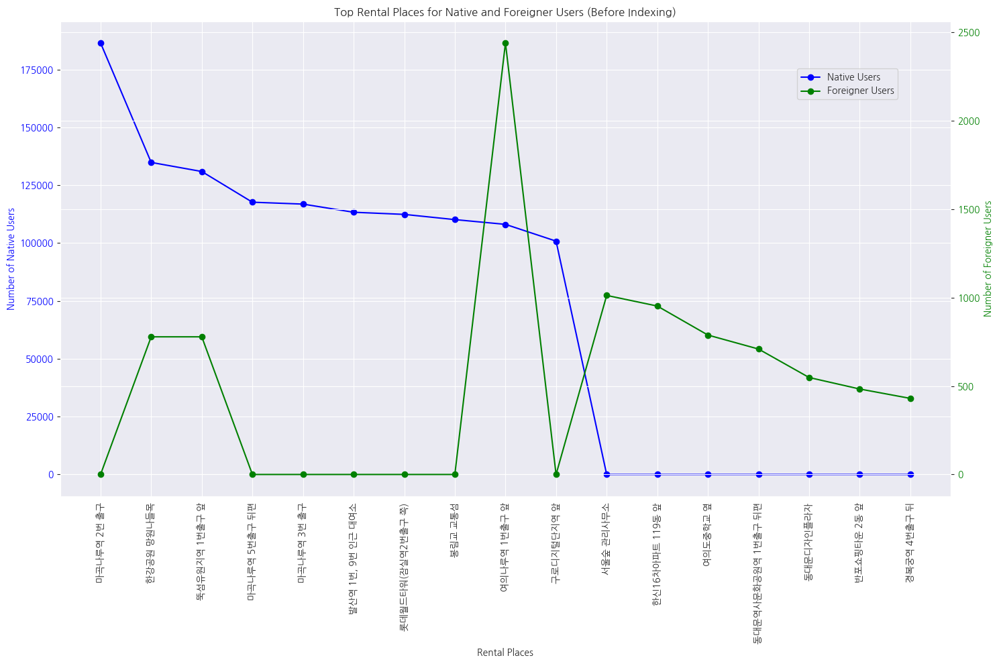

In [39]:
import time
from pymongo import MongoClient
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import font_manager, rc

# 한글 폰트 설정
font_path = '/Users/jiny/Library/Fonts/NanumGothic-Regular.ttf'  # 사용하려는 폰트 경로로 설정
font_manager.fontManager.addfont(font_path)
font_name = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font_name)

client = MongoClient('mongodb://localhost:27017/')
db = client['cycle']

# 인덱스 생성 전 실행 시간 측정
start_time = time.time()

# 대여소별 내국인 및 외국인 사용자 수 상위 10개
pipeline = [
    {
        "$group": {
            "_id": {
                "rental_place": "$rental_place",
                "usr_cls_cd": "$user.usr_cls_cd"
            },
            "totalUsers": {"$sum": 1}
        }
    },
    {
        "$facet": {
            "native": [
                {"$match": {"_id.usr_cls_cd": "내국인"}},
                {"$sort": {"totalUsers": -1}},
                {"$limit": 10}
            ],
            "foreigner": [
                {"$match": {"_id.usr_cls_cd": "외국인"}},
                {"$sort": {"totalUsers": -1}},
                {"$limit": 10}
            ]
        }
    }
]

result = list(db.rental_info.aggregate(pipeline))

end_time = time.time()
execution_time_before_index = end_time - start_time
print(f"Execution time before indexing: {execution_time_before_index} seconds")

# 데이터가 없는 경우를 대비해 예외 처리 추가
native_places = []
native_counts = []
if 'native' in result[0]:
    native_places = [doc['_id']['rental_place'] for doc in result[0]['native']]
    native_counts = [doc['totalUsers'] for doc in result[0]['native']]

foreigner_places = []
foreigner_counts = []
if 'foreigner' in result[0]:
    foreigner_places = [doc['_id']['rental_place'] for doc in result[0]['foreigner']]
    foreigner_counts = [doc['totalUsers'] for doc in result[0]['foreigner']]

# Creating a combined DataFrame for easier plotting
df_native = pd.DataFrame({'Place': native_places, 'Native_Count': native_counts})
df_foreigner = pd.DataFrame({'Place': foreigner_places, 'Foreigner_Count': foreigner_counts})

# Merging dataframes on Place
df_combined = pd.merge(df_native, df_foreigner, on='Place', how='outer').fillna(0)

# Plotting the data
fig, ax1 = plt.subplots(figsize=(15, 10))

# Plotting native users on the primary y-axis
ax1.plot(df_combined['Place'], df_combined['Native_Count'], color='blue', marker='o', linestyle='-', label='Native Users')
ax1.set_xlabel('Rental Places')
ax1.set_ylabel('Number of Native Users', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.tick_params(axis='x', rotation=90)

# Creating a secondary y-axis for foreign users
ax2 = ax1.twinx()
ax2.plot(df_combined['Place'], df_combined['Foreigner_Count'], color='green', marker='o', linestyle='-', label='Foreigner Users')
ax2.set_ylabel('Number of Foreigner Users', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Adding title and legend
plt.title('Top Rental Places for Native and Foreigner Users (Before Indexing)')
fig.tight_layout()
fig.legend(loc='upper right', bbox_to_anchor=(0.9,0.9))

plt.show()


Execution time after indexing: 46.25203776359558 seconds


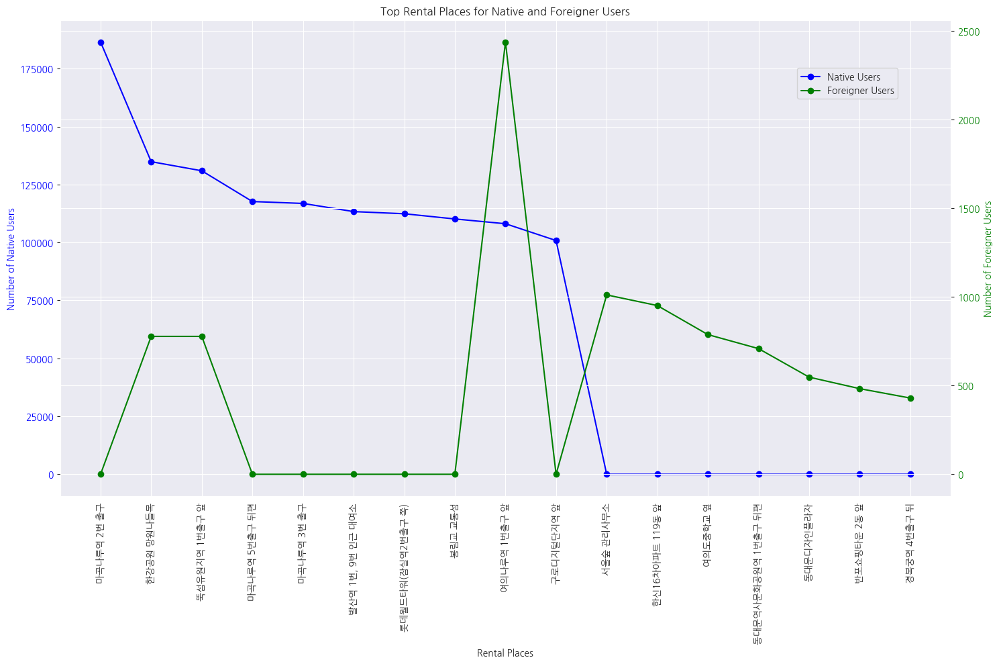

In [26]:
import time
from pymongo import MongoClient
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import font_manager, rc

# 한글 폰트 설정
font_path = '/Users/jiny/Library/Fonts/NanumGothic-Regular.ttf'  # 사용하려는 폰트 경로로 설정
font_manager.fontManager.addfont(font_path)
font_name = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font_name)

client = MongoClient('mongodb://localhost:27017/')
db = client['cycle']

# 인덱스 생성
# db.rental_info.create_index([("user.usr_cls_cd", 1), ("rental_place", 1)])

# 인덱스 생성 후 실행 시간 측정
start_time = time.time()

# 대여소별 내국인 및 외국인 사용자 수 상위 10개
pipeline = [
    {
        "$group": {
            "_id": {
                "rental_place": "$rental_place",
                "usr_cls_cd": "$user.usr_cls_cd"
            },
            "totalUsers": {"$sum": 1}
        }
    },
    {
        "$facet": {
            "native": [
                {"$match": {"_id.usr_cls_cd": "내국인"}},
                {"$sort": {"totalUsers": -1}},
                {"$limit": 10}
            ],
            "foreigner": [
                {"$match": {"_id.usr_cls_cd": "외국인"}},
                {"$sort": {"totalUsers": -1}},
                {"$limit": 10}
            ]
        }
    }
]

result = list(db.rental_info.aggregate(pipeline))

end_time = time.time()
execution_time_after_index = end_time - start_time
print(f"Execution time after indexing: {execution_time_after_index} seconds")

# 데이터가 없는 경우를 대비해 예외 처리 추가
native_places = []
native_counts = []
if 'native' in result[0]:
    native_places = [doc['_id']['rental_place'] for doc in result[0]['native']]
    native_counts = [doc['totalUsers'] for doc in result[0]['native']]

foreigner_places = []
foreigner_counts = []
if 'foreigner' in result[0]:
    foreigner_places = [doc['_id']['rental_place'] for doc in result[0]['foreigner']]
    foreigner_counts = [doc['totalUsers'] for doc in result[0]['foreigner']]

# Creating a combined DataFrame for easier plotting
df_native = pd.DataFrame({'Place': native_places, 'Native_Count': native_counts})
df_foreigner = pd.DataFrame({'Place': foreigner_places, 'Foreigner_Count': foreigner_counts})

# Merging dataframes on Place
df_combined = pd.merge(df_native, df_foreigner, on='Place', how='outer').fillna(0)

# Plotting the data
fig, ax1 = plt.subplots(figsize=(15, 10))

# Plotting native users on the primary y-axis
ax1.plot(df_combined['Place'], df_combined['Native_Count'], color='blue', marker='o', linestyle='-', label='Native Users')
ax1.set_xlabel('Rental Places')
ax1.set_ylabel('Number of Native Users', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.tick_params(axis='x', rotation=90)

# Creating a secondary y-axis for foreign users
ax2 = ax1.twinx()
ax2.plot(df_combined['Place'], df_combined['Foreigner_Count'], color='green', marker='o', linestyle='-', label='Foreigner Users')
ax2.set_ylabel('Number of Foreigner Users', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Adding title and legend
plt.title('Top Rental Places for Native and Foreigner Users')
fig.tight_layout()
fig.legend(loc='upper right', bbox_to_anchor=(0.9,0.9))

plt.show()

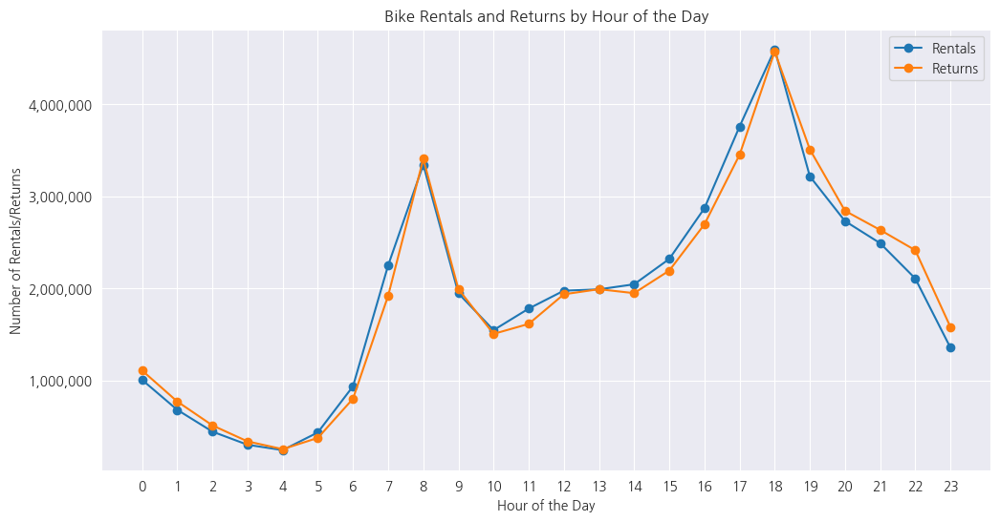

In [14]:
from pymongo import MongoClient
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

client = MongoClient('mongodb://localhost:27017/')
db = client['cycle']

# 대여 및 반납 시간대 분석 쿼리
pipeline = [
    {
        "$project": {
            "rental_hour": {"$hour": "$rental_date"},
            "return_hour": {"$hour": "$return_date"}
        }
    },
    {
        "$facet": {
            "rental_hours": [
                {
                    "$group": {
                        "_id": "$rental_hour",
                        "count": {"$sum": 1}
                    }
                },
                {
                    "$sort": {"_id": 1}
                }
            ],
            "return_hours": [
                {
                    "$group": {
                        "_id": "$return_hour",
                        "count": {"$sum": 1}
                    }
                },
                {
                    "$sort": {"_id": 1}
                }
            ]
        }
    }
]

result = list(db.rental_info.aggregate(pipeline))

rental_hours = result[0]['rental_hours']
return_hours = result[0]['return_hours']

# Extracting data for visualization
rental_hours_data = {doc['_id']: doc['count'] for doc in rental_hours}
return_hours_data = {doc['_id']: doc['count'] for doc in return_hours}

# Creating lists of hours and counts for plotting
hours = range(24)
rental_counts = [rental_hours_data.get(hour, 0) for hour in hours]
return_counts = [return_hours_data.get(hour, 0) for hour in hours]

# Plotting the data
plt.figure(figsize=(12, 6))
plt.plot(hours, rental_counts, label='Rentals', marker='o')$
plt.plot(hours, return_counts, label='Returns', marker='o')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Rentals/Returns')
plt.title('Bike Rentals and Returns by Hour of the Day')
plt.xticks(hours)
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x):,}'))  # Y축 레이블을 천단위로 포맷팅
plt.grid(True)
plt.legend()
plt.show()

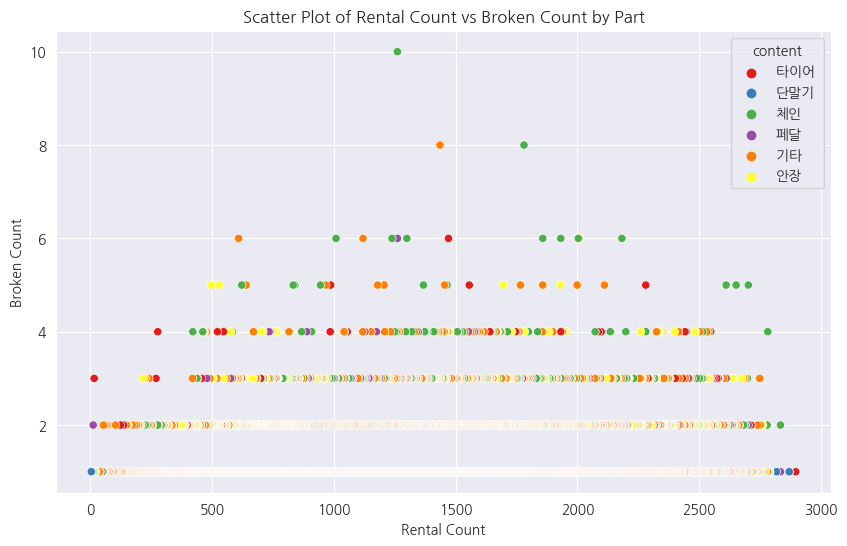

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pymongo import MongoClient

# MongoDB에서 데이터 가져오기
client = MongoClient('mongodb://localhost:27017/')
db = client['cycle']
collection = db['cycle_part_breakdown_correlation']

# 데이터프레임으로 변환
cursor = collection.find({})
df = pd.DataFrame(list(cursor))

# 산점도 그리기
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='rental_count', y='broken_count', hue='content', palette='Set1')
plt.title('Scatter Plot of Rental Count vs Broken Count by Part')
plt.xlabel('Rental Count')
plt.ylabel('Broken Count')
plt.show()

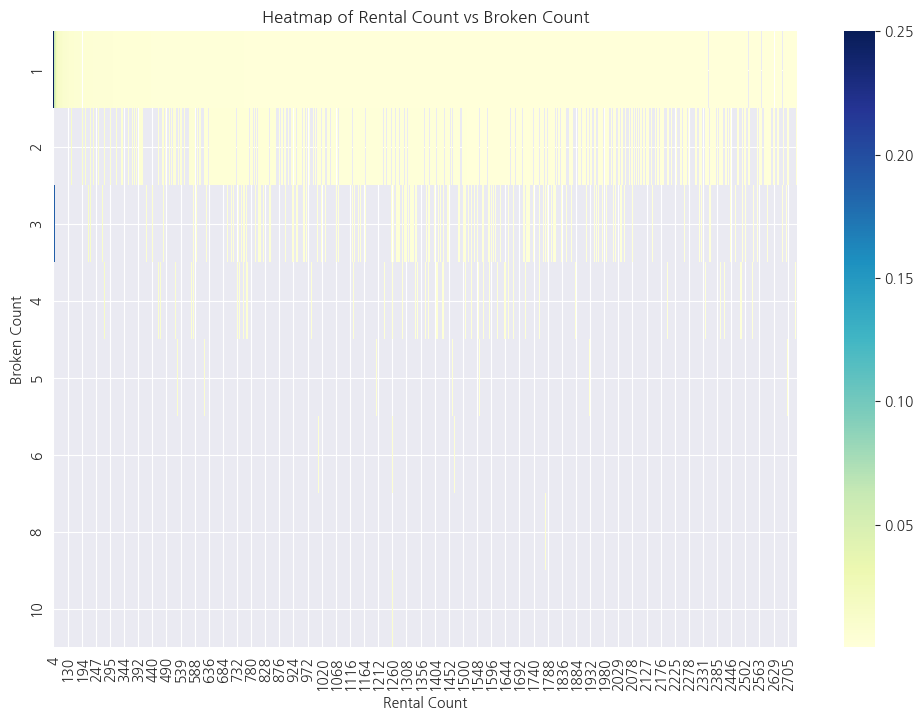

In [28]:
plt.figure(figsize=(12, 8))
pivot_table = df.pivot_table(index='broken_count', columns='rental_count', values='correlation', aggfunc='mean')
sns.heatmap(pivot_table, cmap='YlGnBu')
plt.title('Heatmap of Rental Count vs Broken Count')
plt.xlabel('Rental Count')
plt.ylabel('Broken Count')
plt.show()

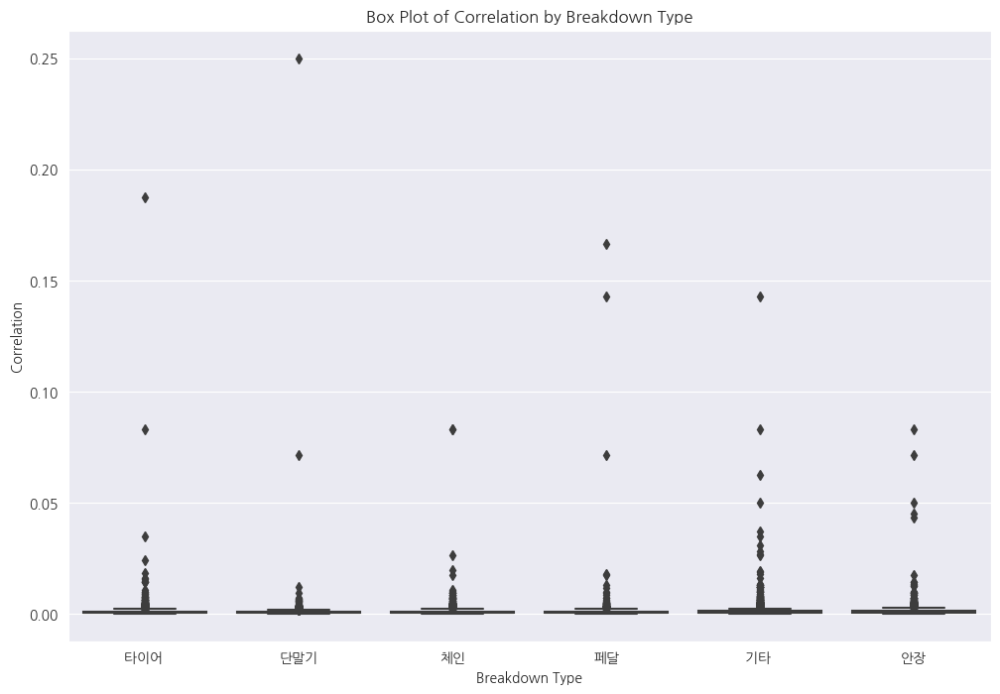

In [29]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='content', y='correlation')
plt.title('Box Plot of Correlation by Breakdown Type')
plt.xlabel('Breakdown Type')
plt.ylabel('Correlation')
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


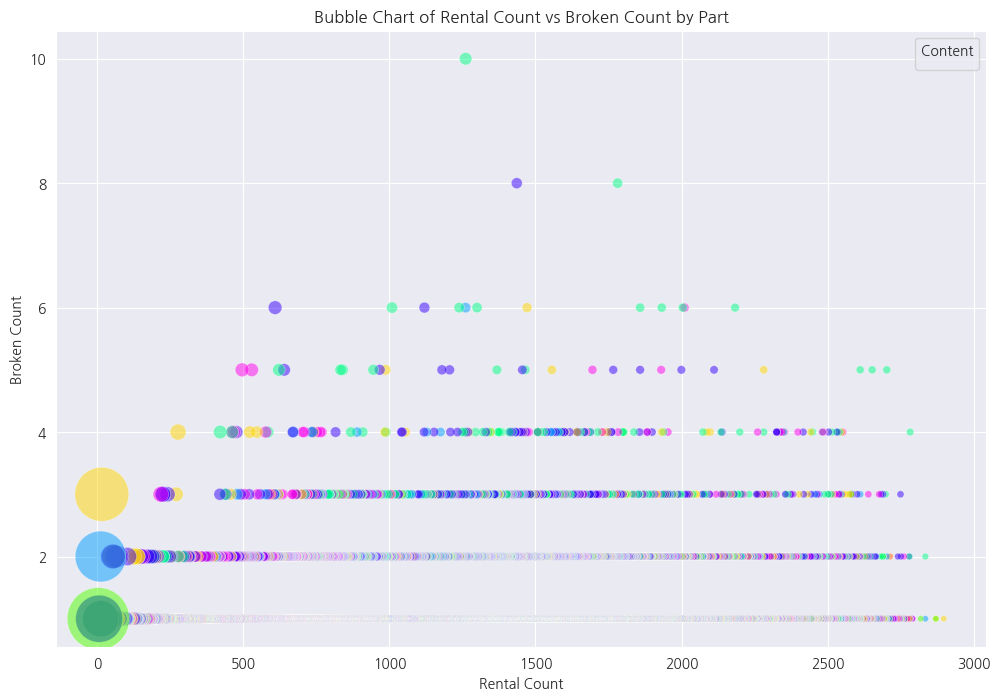

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pymongo import MongoClient

# MongoDB에서 데이터 가져오기
client = MongoClient('mongodb://localhost:27017/')
db = client['cycle']
collection = db['cycle_part_breakdown_correlation']

# 데이터프레임으로 변환
cursor = collection.find({})
df = pd.DataFrame(list(cursor))

# 버블 차트 그리기
plt.figure(figsize=(12, 8))

# 컬러 팔레트 설정
palette = sns.color_palette("hsv", len(df['content'].unique()))
sns.scatterplot(
    data=df,
    x='rental_count',
    y='broken_count',
    size='correlation',
    hue='content',
    sizes=(20, 2000),
    alpha=0.5,
    palette=palette,
    legend=False
)

plt.title('Bubble Chart of Rental Count vs Broken Count by Part')
plt.xlabel('Rental Count')
plt.ylabel('Broken Count')
plt.legend(title='Content', loc='upper right')
plt.show()

In [32]:
!pip install squarify

/opt/homebrew/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/homebrew/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/homebrew/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/homebrew/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/homebrew/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_a

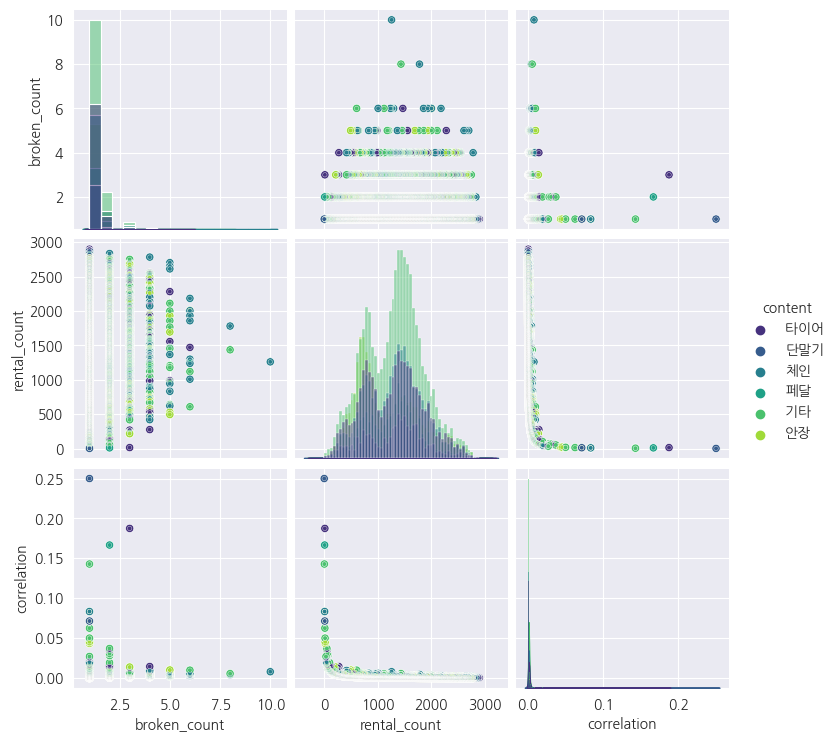

In [38]:
import seaborn as sns
import pandas as pd
from pymongo import MongoClient

# MongoDB에서 데이터 가져오기
client = MongoClient('mongodb://localhost:27017/')
db = client['cycle']
collection = db['cycle_part_breakdown_correlation']

# 데이터프레임으로 변환
cursor = collection.find({})
df = pd.DataFrame(list(cursor))

# 페어 플롯 그리기
g = sns.pairplot(df, hue='content', height=2.5, palette='viridis')
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot, s=10)
plt.show()
